In [1]:
!pip install category_encoders

In [2]:
import os
import pandas as pd
import numpy as np
from datetime import datetime
start_time = datetime.now()


import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

%matplotlib inline
# figure size in inches
rcParams['figure.figsize'] = 8,6


# Plotly visualizations
from plotly import tools
# import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.offline as pyo
import plotly.express as px
init_notebook_mode(connected=True)

# For oversampling Library (Dealing with Imbalanced Datasets)
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.preprocessing import LabelEncoder
# For undersamping
from imblearn.under_sampling import RandomUnderSampler

# for encoding and normalization
from category_encoders import TargetEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline

from imblearn.under_sampling import NearMiss
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold, StratifiedShuffleSplit
from sklearn.linear_model import LogisticRegression

from sklearn.feature_selection import VarianceThreshold

# import lightgbm as lgb
import math
import itertools as it
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
import warnings
warnings.filterwarnings("ignore")

# Classifiers
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Other machine learning tools

from sklearn.feature_selection import RFECV
import scipy.stats as sps

from sklearn.ensemble import BaggingClassifier


pd.set_option('display.max_rows', 20)
pd.set_option('display.max_columns', 20)

# 

In [3]:
df = pd.read_csv("C:\\Users\\zipho\\Downloads\\Research\\Project\\Datasets\\rejected_2007_to_2018q4.csv\\accepted_2007_to_2018Q4.csv")

df = df.dropna(subset=["loan_status"])
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,C,C4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,C,C1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
2,68341763,NaN,20000.0,20000.0,20000.0,60 months,10.78,432.66,B,B4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
3,66310712,NaN,35000.0,35000.0,35000.0,60 months,14.85,829.90,C,C5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
4,68476807,NaN,10400.0,10400.0,10400.0,60 months,22.45,289.91,F,F1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
#reduce the data size to fasten following steps, otherwise the memory will soon run out
complete_df = df.sample(n=100000, random_state=42)

In [5]:
# Add necessary variables
# Determining the loans that are bad from loan_status column --dependent variable (y)
bad_loan = ["Charged Off", "Default", "Does not meet the credit policy. Status:Charged Off", "In Grace Period",
            "Late (16-30 days)", "Late (31-120 days)"]
complete_df['loan_condition_int'] = complete_df['loan_status'].apply(lambda status: 1 if status in bad_loan else 0).astype(int)
complete_df['loan_condition'] = np.where(complete_df['loan_condition_int'] == 0, 'Good Loan', 'Bad Loan')

#emp_length
emp_length_mapping = {
    '10+ years': 10,
    '9 years': 9,
    '8 years': 8,
    '7 years': 7,
    '6 years': 6,
    '5 years': 5,
    '4 years': 4,
    '3 years': 3,
    '2 years': 2,
    '1 year': 1,
    '< 1 year': 0.5,
    'n/a': 0
}
complete_df['emp_length_int'] = complete_df['emp_length'].map(emp_length_mapping)
complete_df.head().transpose()

# region
state_to_region = {
    'CA': 'West', 'OR': 'West', 'UT': 'West', 'WA': 'West', 'CO': 'West',
    'NV': 'West', 'AK': 'West', 'MT': 'West', 'HI': 'West', 'WY': 'West', 'ID': 'West',
    'AZ': 'SouthWest', 'TX': 'SouthWest', 'NM': 'SouthWest', 'OK': 'SouthWest',
    'GA': 'SouthEast', 'NC': 'SouthEast', 'VA': 'SouthEast', 'FL': 'SouthEast', 'KY': 'SouthEast',
    'SC': 'SouthEast', 'LA': 'SouthEast', 'AL': 'SouthEast', 'WV': 'SouthEast', 'DC': 'SouthEast',
    'AR': 'SouthEast', 'DE': 'SouthEast', 'MS': 'SouthEast', 'TN': 'SouthEast',
    'IL': 'MidWest', 'MO': 'MidWest', 'MN': 'MidWest', 'OH': 'MidWest', 'WI': 'MidWest',
    'KS': 'MidWest', 'MI': 'MidWest', 'SD': 'MidWest', 'IA': 'MidWest', 'NE': 'MidWest',
    'IN': 'MidWest', 'ND': 'MidWest',
    'CT': 'NorthEast', 'NY': 'NorthEast', 'PA': 'NorthEast', 'NJ': 'NorthEast', 'RI': 'NorthEast',
    'MA': 'NorthEast', 'MD': 'NorthEast', 'VT': 'NorthEast', 'NH': 'NorthEast', 'ME': 'NorthEast'
}
complete_df['region'] = complete_df['addr_state'].map(state_to_region)
complete_df.head().transpose()

,1758074,686539,900731,1727935,539695
id,9785323,78558461,110757806,96668860,118207599
member_id,NaN,NaN,NaN,NaN,NaN
loan_amnt,28000.0,10650.0,18000.0,3975.0,4800.0
funded_amnt,28000.0,10650.0,18000.0,3975.0,4800.0
funded_amnt_inv,28000.0,10650.0,18000.0,3975.0,4800.0
...,...,...,...,...,...
settlement_term,NaN,NaN,NaN,NaN,NaN
loan_condition_int,0,0,0,0,0
loan_condition,Good Loan,Good Loan,Good Loan,Good Loan,Good Loan
emp_length_int,10.0,10.0,9.0,2.0,0.5


In [6]:
EDA_df = complete_df.copy()

EDA_cat_columns = EDA_df.select_dtypes(include=['object']).columns.tolist()
EDA_num_columns = EDA_df.select_dtypes(exclude=['object']).columns.tolist()

# Filter categorical columns with unique value count less than or equal to the specified threshold.
filtered_EDA_cat_columns = [col for col in EDA_cat_columns if EDA_df[col].nunique() <= 50]

In [7]:
def plot_variable_distribution(dataframe, variable_name):
    if dataframe[variable_name].dtype == 'object':
        # Categorical variables, draw a histogram
        sns.countplot(x=variable_name, data=dataframe)
        plt.xlabel(variable_name)
        plt.ylabel('Count')
        plt.title(f'Distribution of {variable_name}')
    else:
        # Numeric variables, plot histograms
        sns.histplot(dataframe[variable_name], kde=True)
        plt.xlabel(variable_name)
        plt.ylabel('Frequency')
        plt.title(f'Distribution of {variable_name}')
    plt.show()

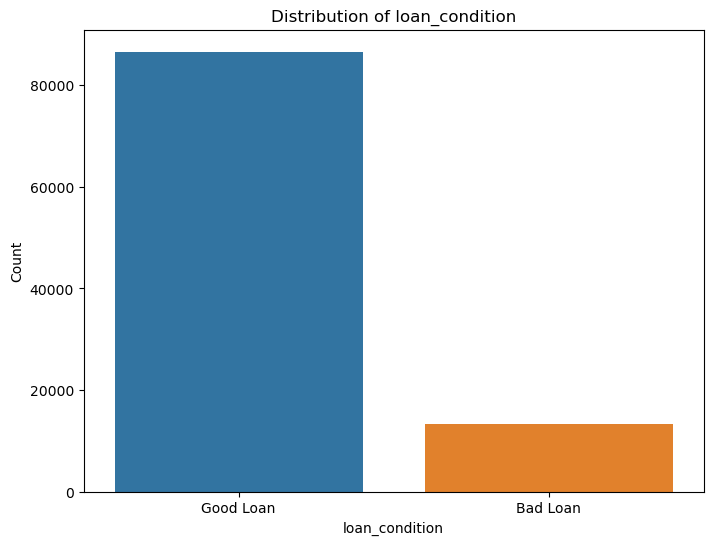

In [8]:
variable = "loan_condition"
plot_variable_distribution(EDA_df, variable)

In [9]:
# Determining the loans that are bad from loan_status column

bad_loan = ["Charged Off", "Default", "Does not meet the credit policy. Status:Charged Off", "In Grace Period", 
            "Late (16-30 days)", "Late (31-120 days)"]


df['loan_condition'] = np.nan

def loan_condition(status):
    if status in bad_loan:
        return 'Bad Loan'
    else:
        return 'Good Loan'
    
    
df['loan_condition'] = df['loan_status'].apply(loan_condition)

In [10]:
drop_df = complete_df
drop_df = complete_df[~complete_df['loan_status'].isin(['Current', 'Issued',
                                #  'In Grace Period', 'Late (16-30 days)', 'Late (31-120 days)',
                                # 'Does not meet the credit policy. Status:Fully Paid', 'Does not meet the credit policy. Status:Charged Off'
                                                           ])]

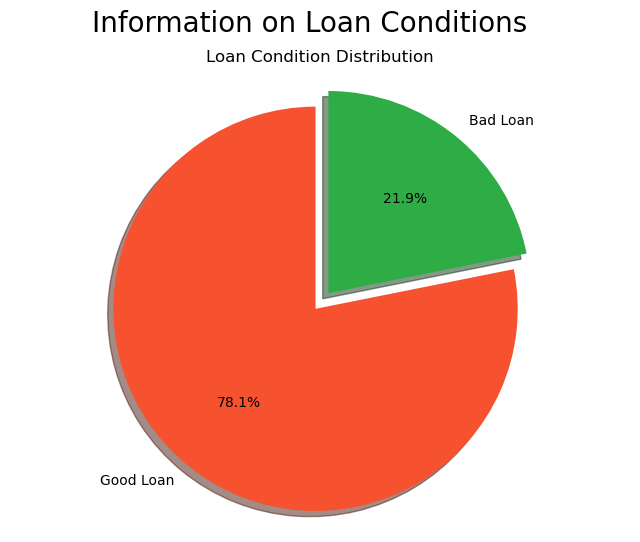

In [11]:
# Plot pie chart for loan condition
loan_condition_counts = drop_df['loan_condition'].value_counts()

fig, ax = plt.subplots(figsize=(8, 6))

# Pie chart
colors = ['#F7522F', '#2EAD46']
explode = [0, 0.1]  # Adjust explode to match the number of categories
labels = loan_condition_counts.index

ax.pie(loan_condition_counts, explode=explode, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors, shadow=True)
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_title('Loan Condition Distribution')

plt.suptitle('Information on Loan Conditions', fontsize=20)
plt.show()

In [12]:
complete_df.dtypes

id                     object
member_id             float64
loan_amnt             float64
funded_amnt           float64
funded_amnt_inv       float64
                       ...   
settlement_term       float64
loan_condition_int      int32
loan_condition         object
emp_length_int        float64
region                 object
Length: 155, dtype: object

In [13]:
pd.value_counts(complete_df.loan_status).to_frame().reset_index()

,loan_status,count
0,Fully Paid,47718
1,Current,38822
2,Charged Off,11868
3,Late (31-120 days),946
4,In Grace Period,335
5,Late (16-30 days),185
6,Does not meet the credit policy. Status:Fully ...,88
7,Does not meet the credit policy. Status:Charge...,36
8,Default,2


In [14]:
def get_missing_value_stats(input_df):
    df_null = pd.DataFrame({
        'Missing Count': input_df.isnull().sum(),
        'Missing Percent': 100 * input_df.isnull().sum() / len(input_df),
        'Type': input_df.dtypes
    })
    missing_values = df_null[df_null['Missing Count'] > 0].sort_values(by='Missing Count', ascending=False) #改
    return missing_values

def get_value_stats(input_df):
    df_null = pd.DataFrame({
        '#Count': input_df.notna().sum(),
        '%Populated': 100 * input_df.notna().sum() / len(input_df),
        '#Unique Values':input_df.nunique(),
        'Most Common Value': input_df.mode().iloc[0],
        'Type': input_df.dtypes
    })

    missing_values = df_null[df_null['#Count'] > 0].sort_values(by='#Count', ascending=False)

    return missing_values

# Finding the the count and percentage of values that are missing.
get_missing_value_stats(drop_df)

,Missing Count,Missing Percent,Type
member_id,61178,100.000000,float64
orig_projected_additional_accrued_interest,60930,99.594626,float64
sec_app_mths_since_last_major_derog,60832,99.434437,float64
hardship_reason,60824,99.421361,object
hardship_dpd,60824,99.421361,float64
...,...,...,...
dti,28,0.045768,float64
chargeoff_within_12_mths,5,0.008173,float64
collections_12_mths_ex_med,5,0.008173,float64
tax_liens,5,0.008173,float64


In [15]:
#drop any columns where over a certain percentage is missing
drop_df = drop_df.dropna(axis=1, thresh=int(0.20*len(drop_df)))
get_missing_value_stats(drop_df)

,Missing Count,Missing Percent,Type
mths_since_recent_bc_dlq,46552,76.092713,float64
mths_since_last_major_derog,44984,73.529700,float64
mths_since_recent_revol_delinq,40485,66.175749,float64
il_util,39485,64.541175,float64
mths_since_rcnt_il,36807,60.163784,float64
...,...,...,...
dti,28,0.045768,float64
collections_12_mths_ex_med,5,0.008173,float64
tax_liens,5,0.008173,float64
chargeoff_within_12_mths,5,0.008173,float64


In [16]:
direct_indicators = [
    'collection_recovery_fee',
    'last_pymnt_amnt',
    'out_prncp',
    'out_prncp_inv',
    'recoveries',
    'total_pymnt',
    'total_pymnt_inv',
    'total_rec_int',
    'total_rec_late_fee',
    'total_rec_prncp'
]

drop_df.drop(direct_indicators, axis=1, inplace=True)

In [17]:
#drop repeated features
#drop_df.drop(['loan_condition'], axis=1, inplace=True)
#drop_df.drop(['loan_status'], axis=1, inplace=True)
drop_df.drop(['emp_length'], axis=1, inplace=True)

drop_df.drop(['id','emp_title','url','title','zip_code'], axis=1, inplace=True)

# unique values a categorical variable (object) has
drop_df.select_dtypes(include=["object"]).nunique()  #include/exclude


term                      2
grade                     7
sub_grade                35
home_ownership            6
verification_status       3
issue_d                 138
loan_status               8
pymnt_plan                2
purpose                  14
addr_state               50
earliest_cr_line        630
initial_list_status       2
last_pymnt_d            134
last_credit_pull_d      123
application_type          2
hardship_flag             2
disbursement_method       2
debt_settlement_flag      2
loan_condition            2
region                    5
dtype: int64

In [18]:
fillna_df = drop_df.copy()

# for object variables - Get the mode of next payment date and last payment date and the last date credit amount was pulled
for column in ["last_pymnt_d", "last_credit_pull_d"]:  #, 'income_category'
    fillna_df[column] = fillna_df.groupby("region")[column].transform(lambda x: x.fillna(x.mode()))

# for numerical variables
# Get the mode on the number of accounts in which the client is delinquent
fillna_df["pub_rec"] = fillna_df.groupby("region")["pub_rec"].transform(lambda x: x.fillna(x.median()))
# Get the mode of the total number of credit lines the borrower has
fillna_df["total_acc"] = fillna_df.groupby("region")["total_acc"].transform(lambda x: x.fillna(x.median()))

fillna_df["emp_length_int"] = fillna_df.groupby("region")["emp_length_int"].transform(lambda x: x.fillna(x.median()))

# Get the mean of the annual income depending on the region the client is located.
fillna_df["annual_inc"] = fillna_df.groupby("region")["annual_inc"].transform(lambda x: x.fillna(x.mean()))
# Mode of credit delinquencies in the past two years.
fillna_df["delinq_2yrs"] = fillna_df.groupby("region")["delinq_2yrs"].transform(lambda x: x.fillna(x.mean()))

In [19]:
# for other, fill in with zero
fillna_df.fillna(0, inplace=True)
fillna_df.isnull().sum().max() # Maximum number of nulls.

0

In [20]:
len(fillna_df['loan_condition_int'])
# Loan Ratios (Imbalanced classes)
fillna_df['loan_condition_int'].value_counts()/len(fillna_df['loan_condition_int']) * 100

loan_condition_int
0    78.14247
1    21.85753
Name: count, dtype: float64

In [21]:
#Custom thresholds
RemoveOutlier_df = fillna_df.copy()
print("Dataset before removing outlier:",RemoveOutlier_df.shape)
RemoveOutlier_df = RemoveOutlier_df[RemoveOutlier_df['annual_inc'] <= 250000]
RemoveOutlier_df = RemoveOutlier_df[RemoveOutlier_df['dti'] <= 50]
RemoveOutlier_df = RemoveOutlier_df[RemoveOutlier_df['open_acc'] <= 40]
RemoveOutlier_df = RemoveOutlier_df[RemoveOutlier_df['total_acc'] <= 80]
RemoveOutlier_df = RemoveOutlier_df[RemoveOutlier_df['revol_util'] <= 120]
RemoveOutlier_df = RemoveOutlier_df[RemoveOutlier_df['revol_bal'] <= 250000]
RemoveOutlier_df.reset_index(drop=True, inplace=True)
print("Dataset after removing outlier:",RemoveOutlier_df.shape)

RemoveOutlier_df.head().transpose()

Dataset before removing outlier: (61178, 99)
Dataset after removing outlier: (60253, 99)


,0,1,2,3,4
loan_amnt,28000.0,10650.0,3975.0,15000.0,8000.0
funded_amnt,28000.0,10650.0,3975.0,15000.0,8000.0
funded_amnt_inv,28000.0,10650.0,3975.0,15000.0,8000.0
term,36 months,36 months,36 months,36 months,36 months
int_rate,6.62,25.11,17.99,6.24,9.67
...,...,...,...,...,...
debt_settlement_flag,N,N,N,N,N
loan_condition_int,0,0,0,0,0
loan_condition,Good Loan,Good Loan,Good Loan,Good Loan,Good Loan
emp_length_int,10.0,10.0,2.0,8.0,10.0


In [22]:
target_col = target_variable = "loan_condition_int"

In [23]:
TE_df = RemoveOutlier_df.copy()

In [24]:
# divide variables into numerical variables and categorical variables, categorical variables are divided into binary variables and multivariate variables
original_cols = TE_df.columns

cat_cols = TE_df.select_dtypes(include=['object']).columns.tolist()
num_cols = [col for col in TE_df.select_dtypes(exclude=['object']).columns.tolist() if col not in ['id', 'loan_condition_int']]

dual_cat_cols = [col for col in cat_cols if TE_df[col].nunique()<=2]
multi_cat_cols =[col for col in cat_cols if TE_df[col].nunique()>2]

multi_cat_cols

['grade',
 'sub_grade',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'purpose',
 'addr_state',
 'earliest_cr_line',
 'last_pymnt_d',
 'last_credit_pull_d',
 'region']

In [25]:
# pair all categorical features with another categorical feature
import itertools
def combine_categories(dataframe, cat_cols, expand_dim=False):
    df = dataframe.copy()
    combined = list(itertools.combinations(cat_cols, 2))
    for c1, c2 in combined:
        df.loc[:, f'{c1}__{c2}'] = df[c1].astype(str) + '_' + df[c2].astype(str)
        if expand_dim:
            cat_cols.append(f'{c1}__{c2}')
    return df, cat_cols

# binary encoding for dual_cat_cols
TE_df = pd.get_dummies(TE_df, columns=dual_cat_cols, drop_first=True)

# update dual_cat_cols
changed_columns = [col for col in TE_df.columns if col not in original_cols]
dual_cat_cols = changed_columns

TE_df.head().transpose()

,0,1,2,3,4
loan_amnt,28000.0,10650.0,3975.0,15000.0,8000.0
funded_amnt,28000.0,10650.0,3975.0,15000.0,8000.0
funded_amnt_inv,28000.0,10650.0,3975.0,15000.0,8000.0
int_rate,6.62,25.11,17.99,6.24,9.67
installment,859.71,424.07,143.69,457.97,256.9
...,...,...,...,...,...
application_type_Joint App,False,False,False,False,False
hardship_flag_Y,False,False,False,False,False
disbursement_method_DirectPay,False,False,False,False,False
debt_settlement_flag_Y,False,False,False,False,False


In [26]:
from sklearn.model_selection import StratifiedShuffleSplit

stratified = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42) #Specify test_size to account for 20%

for train_set, test_set in stratified.split(TE_df, TE_df[target_col]):
    stratified_train = TE_df.loc[train_set]
    stratified_test = TE_df.loc[test_set]

train_df = stratified_train
test_df = stratified_test

# Let's Shuffle the data
train_df = train_df.sample(frac=1).reset_index(drop=True)
test_df = test_df.sample(frac=1).reset_index(drop=True)

print("Train Data\n ", train_df[target_col].value_counts()/len(TE_df))
print("Test Data\n ",test_df[target_col].value_counts()/len(TE_df))
train_df.shape

Train Data
  loan_condition_int
0    0.625098
1    0.174896
Name: count, dtype: float64
Test Data
  loan_condition_int
0    0.156291
1    0.043716
Name: count, dtype: float64


(48202, 99)

In [27]:
# separates the y(target variables) and X(features) for the training and testing datasets

train_y = train_df[[target_col]]
test_y = test_df[[target_col]]

train_X = train_df.drop(target_col, axis=1, inplace=False)
test_X = test_df.drop(target_col, axis=1, inplace=False)

train_X.shape

(48202, 98)

In [28]:
# Create a data set containing only multi-categorical variables
multi_cat_train_X = train_X[multi_cat_cols]
multi_cat_test_X = test_X[multi_cat_cols]

# Target encode categorical variables with smoothing method (on train set)
encoder = TargetEncoder(smoothing=0.2)
encoder.fit(multi_cat_train_X, train_y)

# Apply the same encoding rules on train and test set
encoded_multi_cat_train_X = encoder.transform(multi_cat_train_X)
encoded_multi_cat_test_X = encoder.transform(multi_cat_test_X)

encoded_train_X = pd.concat([train_X.drop(columns=multi_cat_cols), encoded_multi_cat_train_X], axis=1)
encoded_test_X = pd.concat([test_X.drop(columns=multi_cat_cols), encoded_multi_cat_test_X], axis=1)

encoded_train_X.head().transpose()

,0,1,2,3,4
loan_amnt,5600.0,10000.0,6000.0,15000.0,3600.0
funded_amnt,5600.0,10000.0,6000.0,15000.0,3600.0
funded_amnt_inv,5600.0,10000.0,6000.0,15000.0,3600.0
int_rate,13.33,7.34,10.16,7.89,12.62
installment,189.58,310.33,194.06,469.29,120.65
...,...,...,...,...,...
addr_state,0.241659,0.181818,0.210497,0.208707,0.240816
earliest_cr_line,0.209486,0.251309,0.158537,0.218622,0.246667
last_pymnt_d,0.181467,0.193388,0.183099,0.193388,0.207699
last_credit_pull_d,0.174684,0.196957,0.157355,0.196957,0.131612


In [29]:
scaler = StandardScaler()

# Fit and apply normalization on the training set
standardized_train_X = encoded_train_X.copy()
standardized_train_X[num_cols] = scaler.fit_transform(encoded_train_X[num_cols])

# Apply the same normalization rules on the test set
standardized_test_X = encoded_test_X.copy()
standardized_test_X[num_cols] = scaler.transform(encoded_test_X[num_cols])

standardized_train_X.head().transpose()

,0,1,2,3,4
loan_amnt,-1.014383,-0.50447,-0.968027,0.074976,-1.246162
funded_amnt,-1.014026,-0.50391,-0.967652,0.075768,-1.245898
funded_amnt_inv,-1.010177,-0.500439,-0.963837,0.078809,-1.241876
int_rate,0.000777,-1.257096,-0.664909,-1.141598,-0.14832
installment,-0.952456,-0.486038,-0.935152,0.127974,-1.218711
...,...,...,...,...,...
addr_state,0.241659,0.181818,0.210497,0.208707,0.240816
earliest_cr_line,0.209486,0.251309,0.158537,0.218622,0.246667
last_pymnt_d,0.181467,0.193388,0.183099,0.193388,0.207699
last_credit_pull_d,0.174684,0.196957,0.157355,0.196957,0.131612


In [30]:
undersampler = RandomUnderSampler(random_state=42)

# Undersampling the training set
standardized_train_X_undersample, train_y_undersample = undersampler.fit_resample(standardized_train_X, train_y) 


print('standardized_train_X_undersample.shape',standardized_train_X_undersample.shape)
pd.value_counts(train_y_undersample.loan_condition_int).to_frame()

standardized_train_X_undersample.shape (21076, 98)


,count
loan_condition_int,
0,10538
1,10538


In [31]:
selector = VarianceThreshold(threshold=1)
selector.fit(standardized_train_X_undersample)

filtered_feature_names = standardized_train_X_undersample.columns[selector.get_support()]
standardized_train_X_undersample_filtered = standardized_train_X_undersample[filtered_feature_names]

standardized_train_X_undersample_filtered.shape

(21076, 44)

In [32]:
#modify this if you want to use SMOTE
to_wrap_train_X = standardized_train_X_undersample_filtered.copy()
train_y = train_y_undersample.copy()

In [33]:
nfeatures = len(to_wrap_train_X.columns)
nfeatures

44

In [34]:
%%time
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

nfeatures = len(to_wrap_train_X.columns)
clf = RandomForestClassifier(n_estimators=5, n_jobs=-1)
sfs = SFS(clf, k_features=nfeatures, forward=True, verbose=2, cv=2, n_jobs=-1)
sfs.fit(to_wrap_train_X, train_y)

from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
vars_FS = pd.DataFrame.from_dict(sfs.get_metric_dict()).T
vars_FS


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  44 out of  44 | elapsed:   12.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  44 out of  44 | elapsed:   12.2s finished

[2024-10-16 13:03:55] Features: 1/44 -- score: 0.8692825963180869[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  43 out of  43 | elapsed:    2.5s finished

[2024-10-16 13:03:58] Features: 2/44 -- score: 0.8692825963180869[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done  42 out of  42 | elapsed:    2.2s finished

[2024-10-16 13:04:00] Features: 3/44 -- score: 0.8690928069842475[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jo

[Parallel(n_jobs=-1)]: Done   3 out of  17 | elapsed:    0.8s remaining:    4.1s
[Parallel(n_jobs=-1)]: Done  12 out of  17 | elapsed:    1.1s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  17 out of  17 | elapsed:    1.4s finished

[2024-10-16 13:05:01] Features: 28/44 -- score: 0.8545264756120706[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  16 | elapsed:    0.5s remaining:    4.3s
[Parallel(n_jobs=-1)]: Done  11 out of  16 | elapsed:    0.7s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  16 out of  16 | elapsed:    1.1s finished

[2024-10-16 13:05:02] Features: 29/44 -- score: 0.8545739229455305[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  15 | elapsed:    1.1s remaining:    0.9s
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    1.4s finished

[2024-10-16 13:05:04] Features: 30/44 -- score: 0.8552381856139685[Parallel(n_jobs=-1)]: Usin

CPU times: total: 5.03 s
Wall time: 1min 35s


,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(10,)","[0.8688555703169482, 0.8697096223192257]",0.869283,"(last_fico_range_high,)",0.001837,0.000427,0.000427
2,"(10, 11)","[0.8688555703169482, 0.8697096223192257]",0.869283,"(last_fico_range_high, last_fico_range_low)",0.001837,0.000427,0.000427
3,"(10, 11, 40)","[0.8684759916492694, 0.8697096223192257]",0.869093,"(last_fico_range_high, last_fico_range_low, nu...",0.002654,0.000617,0.000617
4,"(10, 11, 14, 40)","[0.8687606756500285, 0.869614727652306]",0.869188,"(last_fico_range_high, last_fico_range_low, ac...",0.001837,0.000427,0.000427
5,"(10, 11, 14, 40, 41)","[0.8687606756500285, 0.8694249383184665]",0.869093,"(last_fico_range_high, last_fico_range_low, ac...",0.001429,0.000332,0.000332
...,...,...,...,...,...,...,...
40,"(0, 2, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...","[0.8525336876067565, 0.8530081609413551]",0.852771,"(loan_amnt, funded_amnt_inv, dti, delinq_2yrs,...",0.001021,0.000237,0.000237
41,"(0, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 1...","[0.8542417916113114, 0.8562345796166255]",0.855238,"(loan_amnt, funded_amnt_inv, int_rate, dti, de...",0.004287,0.000996,0.000996
42,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[0.851679635604479, 0.8559498956158664]",0.853815,"(loan_amnt, funded_amnt_inv, int_rate, install...",0.009187,0.002135,0.002135
43,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.8543366862782311, 0.8544315809451509]",0.854384,"(loan_amnt, funded_amnt, funded_amnt_inv, int_...",0.000204,0.000047,0.000047


In [35]:
vars_final = list(vars_FS.loc[15, 'feature_names'])
vars_final

['delinq_2yrs',
 'last_fico_range_high',
 'last_fico_range_low',
 'collections_12_mths_ex_med',
 'acc_now_delinq',
 'tot_coll_amt',
 'open_acc_6m',
 'open_il_12m',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'all_util',
 'chargeoff_within_12_mths',
 'num_tl_120dpd_2m',
 'num_tl_30dpd']

In [36]:
# Use wrapper to reduce variables
wrapped_train_X = to_wrap_train_X.filter(vars_final, axis=1)
wrapped_test_X = standardized_test_X.filter(vars_final, axis=1)


print("final train/test X shape (target encoded):", wrapped_train_X.shape, wrapped_test_X.shape)
print("final train/test y shape:", train_y.shape, test_y.shape)

final train/test X shape (target encoded): (21076, 15) (12051, 15)
final train/test y shape: (21076, 1) (12051, 1)


In [37]:
wrapped_train_X.head()

,delinq_2yrs,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,open_acc_6m,open_il_12m,total_bal_il,il_util,open_rv_12m,all_util,chargeoff_within_12_mths,num_tl_120dpd_2m,num_tl_30dpd
23324,-0.363123,0.534397,0.426729,-0.117757,-0.066139,0.223267,1.704383,-0.430321,-0.192765,1.058847,1.970405,0.640885,-0.077783,-0.020292,-0.055666
15737,-0.363123,1.701190,1.140723,-0.117757,-0.066139,-0.121807,-0.459917,-0.430321,-0.456882,-0.685557,-0.472138,-0.751800,-0.077783,-0.020292,-0.055666
47772,-0.363123,1.394139,0.952830,-0.117757,-0.066139,-0.121807,-0.459917,-0.430321,-0.456882,-0.685557,-0.472138,-0.751800,-0.077783,-0.020292,-0.055666
28555,0.794500,0.841448,0.614622,-0.117757,-0.066139,-0.121807,-0.459917,-0.430321,-0.456882,-0.685557,-0.472138,-0.751800,-0.077783,-0.020292,-0.055666
5922,-0.363123,0.227347,0.238836,-0.117757,-0.066139,-0.121807,-0.459917,-0.430321,-0.456882,-0.685557,-0.472138,-0.751800,-0.077783,-0.020292,-0.055666


In [39]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

def plot_confusion_matrix(mean_conf_matrix, xtick_labels=None, ytick_labels=None):
    fig, axes = plt.subplots(figsize=(8, 6))
    default_style = sns.axes_style()
    # sns.set(font_scale=1.5)
    ax = sns.heatmap(mean_conf_matrix.T, annot=True, cmap='Blues', fmt=".1f",annot_kws={"size": 18})
    if xtick_labels:
        ax.set_xticklabels(xtick_labels)
    if ytick_labels:
        ax.set_yticklabels(ytick_labels)


    ax.set_xlabel('True Label')
    ax.set_ylabel('Predicted Label')
    ax.axis('equal')
    plt.title('Mean Confusion Matrix')
    sns.set_style(default_style)
    plt.show()

def calculate_scores(model, X_trn, y_trn, X_tst, y_tst):
    """Calculate various classification scores on the test set"""
    model.fit(X_trn, y_trn)
    y_pred = model.predict(X_tst)
    accuracy = accuracy_score(y_tst, y_pred)

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_tst, y_pred)

    # Calculate precision, recall, and F1-score
    precision = precision_score(y_tst, y_pred)
    recall = recall_score(y_tst, y_pred)
    f1 = f1_score(y_tst, y_pred)

    y_pred_proba = model.predict_proba(X_tst)[:,1]
    auc = roc_auc_score(y_tst, y_pred_proba)

    mask = y_tst['loan_condition_int'].astype(bool).values
    churn = y_pred_proba[mask]
    not_churn = y_pred_proba[~mask]
    ks = sps.ks_2samp(churn, not_churn)[0]

    return accuracy, auc, ks, conf_matrix, precision, recall, f1

def fit_first_level(models, X_trn, y_trn, X_tst):
    """
    Prepare first-level model fitting for stacking. Only used during model stacking.
    Output the predicted probabilities of the first-level models as features for the stacking model.
    """
    # Create dataframes to store predictions of the first-level models
    X2_trn = np.zeros((len(X_trn), 2 * len(models)))
    X2_tst = np.zeros((len(X_tst), 2 * len(models)))

    for i, model in enumerate(models.values()):
        print("Stacking with", model)

        model.fit(X_trn, y_trn)
        y_trn_pred_proba = model.predict_proba(X_trn)
        y_tst_pred_proba = model.predict_proba(X_tst)

        X2_trn[:, i*2:(i+1)*2] = y_trn_pred_proba
        X2_tst[:, i*2:(i+1)*2] = y_tst_pred_proba

    return X2_trn, X2_tst

def calculate_cv_scores(model, X, y, cv=5, stacking=False, models=None, verbose=False):
    """Calculate average k-fold cross-validated classification scores"""
    kf = KFold(n_splits=cv, shuffle=True)
    accuracy_scores = []
    auc_scores = []
    ks_scores = []
    conf_matrices = []  # Store confusion matrices for each fold
    precision_scores = []
    recall_scores = []
    f1_scores = []
    fold_count = 0

    for train_index, test_index in kf.split(X):
        X_trn, X_tst = X.iloc[train_index], X.iloc[test_index]
        y_trn, y_tst = y.iloc[train_index], y.iloc[test_index]

        if stacking:
            # smote = False
            X_trn, X_tst = fit_first_level(models, X_trn, y_trn, X_tst)

        accuracy, auc, ks, conf_matrix, precision, recall, f1 = calculate_scores(model, X_trn, y_trn, X_tst, y_tst)
        accuracy_scores.append(accuracy)
        auc_scores.append(auc)
        ks_scores.append(ks)
        conf_matrices.append(conf_matrix)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)

        # if verbose:
        #     print(f"Fold {fold_count} accuracy, auc, ks:", accuracy, auc, ks)

        fold_count += 1

    # mean confusion matrix
    mean_conf_matrix = np.mean(conf_matrices, axis=0) #/ np.sum(np.mean(conf_matrices, axis=0)))
    print(f"Mean Confusion Matrix for Model:\n", mean_conf_matrix)
    plot_confusion_matrix(mean_conf_matrix, xtick_labels=['Good Loan', 'Bad Loan'], ytick_labels=['Good Loan', 'Bad Loan'])

    return np.mean(accuracy_scores), np.mean(auc_scores), np.mean(ks_scores), np.mean(precision_scores), np.mean(recall_scores), np.mean(f1_scores)

def fit_models_summary(models, X, y, cv=5, smote = False,undersample = False):
    """
    Calculate average k-fold cross-validated classification scores for multiple models.
    Generate a summary dataframe.
    """
    baseline = pd.DataFrame(columns=['accuracy', 'auc', 'ks', 'precision', 'recall', 'f1'])

    for name, model in models.items():
        # accuracy, auc, ks, precision, recall, f1 = calculate_cv_scores(model, X, y, cv=cv, smote=False)
        # baseline.loc[name] = [accuracy, auc, ks, None, precision, recall, f1]

        accuracy, auc, ks, precision, recall, f1 = calculate_cv_scores(model, X, y, cv=cv)

        if smote:
            baseline.loc["{} (SMOTE)".format(name)] = [accuracy, auc, ks, precision, recall, f1]
        if undersample:
            baseline.loc["{} (undersample)".format(name)] = [accuracy, auc, ks, precision, recall, f1]

        print(f"{name} processed")

    return baseline

In [40]:
mss=60
msl=int(mss/2)

models = {
     'Logistic Regression': LogisticRegression(),
     'Decision Tree': DecisionTreeClassifier(max_depth=10,min_samples_split=mss,min_samples_leaf=msl),
     'K Nearest Neighbors': KNeighborsClassifier(n_neighbors=20),
     'Random Forest': RandomForestClassifier(n_estimators=20,max_depth=10),
     'Gaussian Naive Bayes': GaussianNB(var_smoothing=1),
     'Light GBM': LGBMClassifier(n_estimators=50,max_depth=3),
     'XGBoost': XGBClassifier(n_estimators=50,max_depth=3),
     'Gradient Boosting': GradientBoostingClassifier(n_estimators=50,max_depth=3),
     "Neural Network": MLPClassifier(hidden_layer_sizes = (10,10)),
# #     'Support Vector Machine': SVC()
}

Mean Confusion Matrix for Model:
 [[1843.8  263.8]
 [ 302.8 1804.8]]


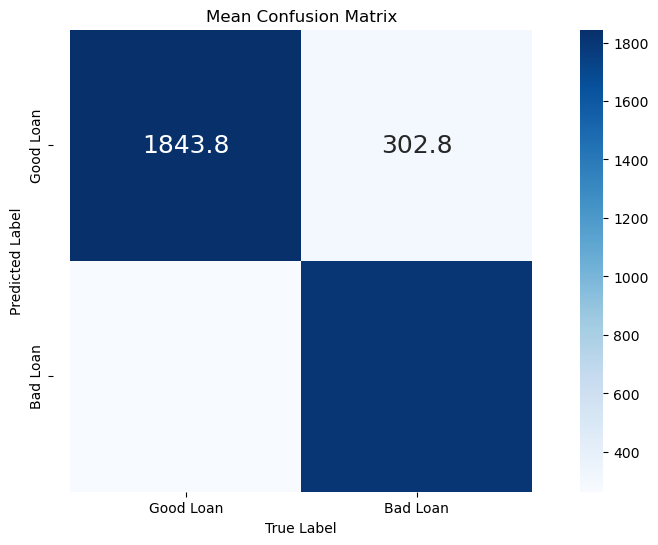

Logistic Regression processed
Mean Confusion Matrix for Model:
 [[1803.8  303.8]
 [ 265.  1842.6]]


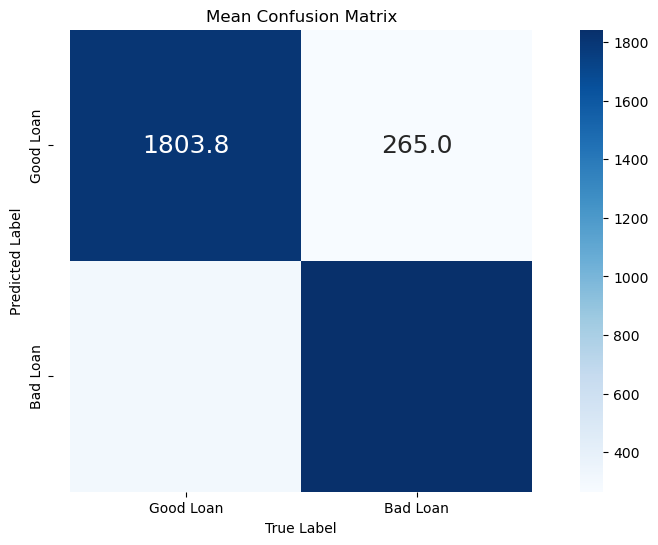

Decision Tree processed
Mean Confusion Matrix for Model:
 [[1948.4  159.2]
 [ 848.  1259.6]]


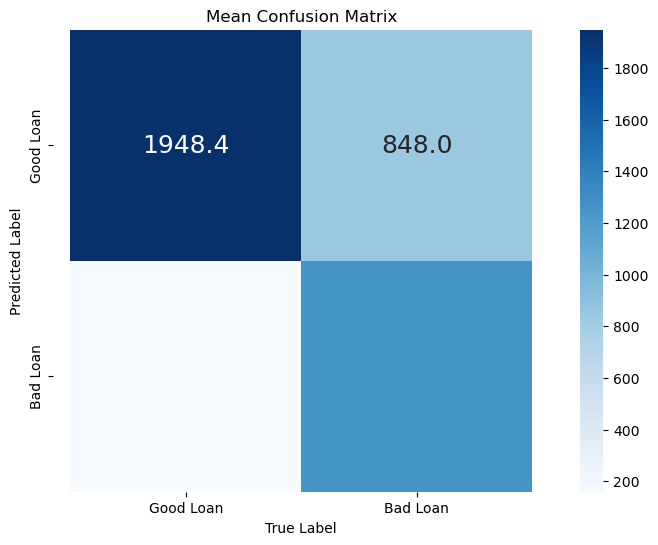

K Nearest Neighbors processed
Mean Confusion Matrix for Model:
 [[1813.   294.6]
 [ 260.  1847.6]]


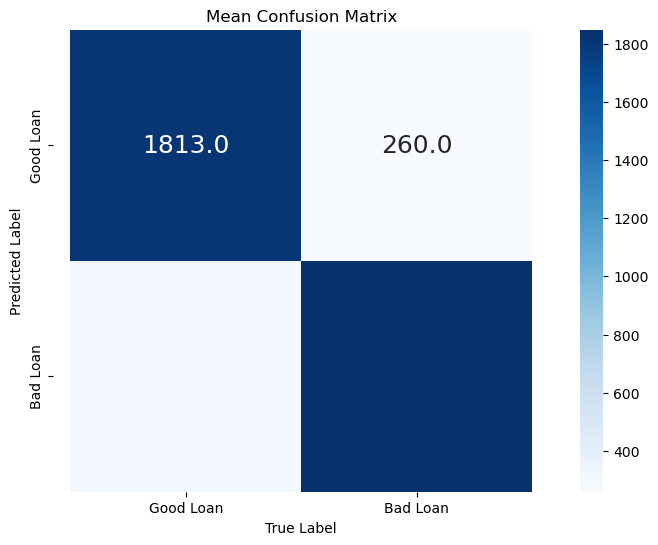

Random Forest processed
Mean Confusion Matrix for Model:
 [[1977.6  130. ]
 [ 955.6 1152. ]]


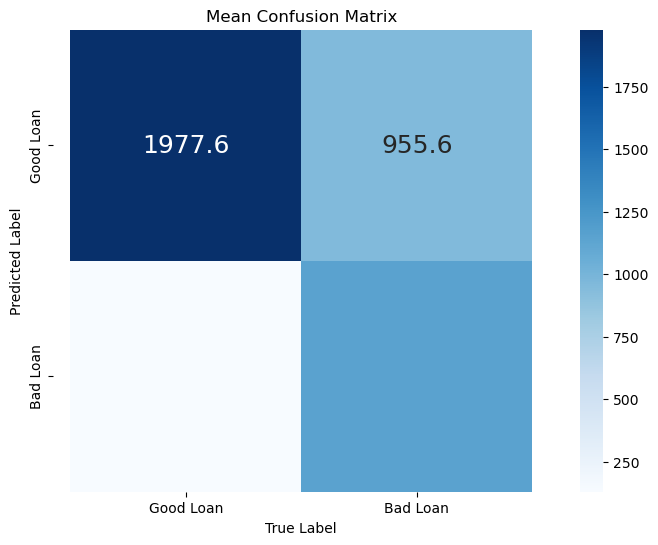

Gaussian Naive Bayes processed
[LightGBM] [Info] Number of positive: 8452, number of negative: 8408
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 985
[LightGBM] [Info] Number of data points in the train set: 16860, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501305 -> initscore=0.005219
[LightGBM] [Info] Start training from score 0.005219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 8452, number of negative: 8409
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you ca

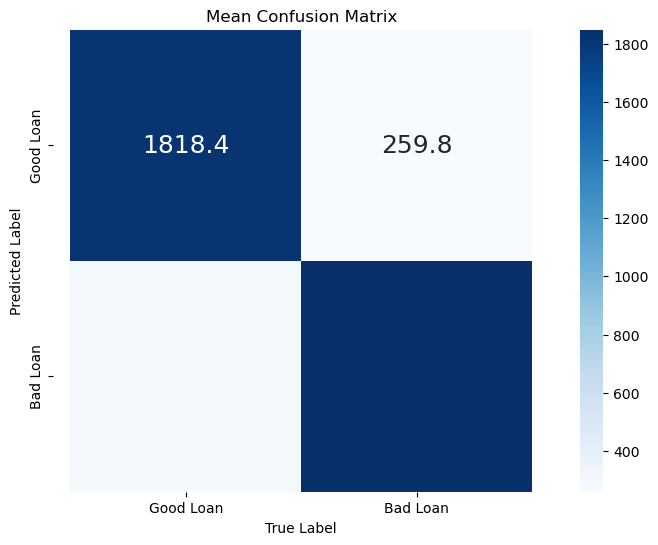

Light GBM processed
Mean Confusion Matrix for Model:
 [[1815.2  292.4]
 [ 262.8 1844.8]]


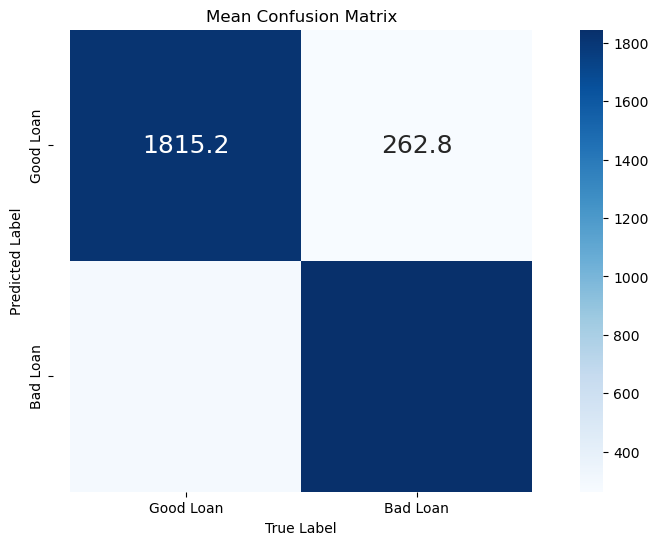

XGBoost processed
Mean Confusion Matrix for Model:
 [[1815.   292.6]
 [ 261.6 1846. ]]


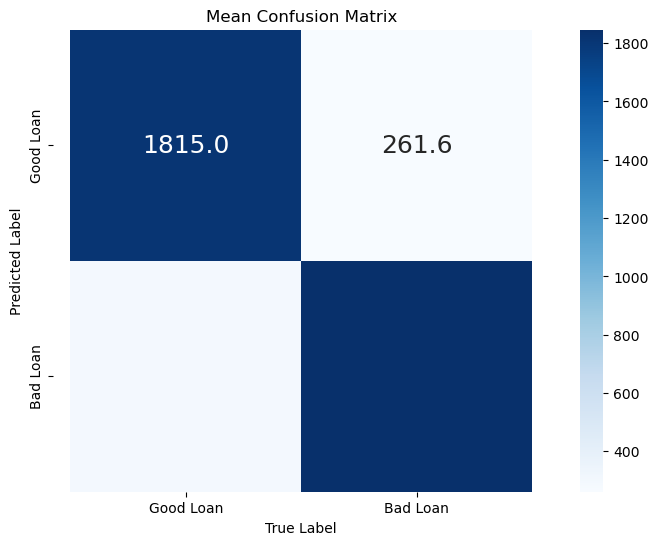

Gradient Boosting processed
Mean Confusion Matrix for Model:
 [[1804.2  303.4]
 [ 255.2 1852.4]]


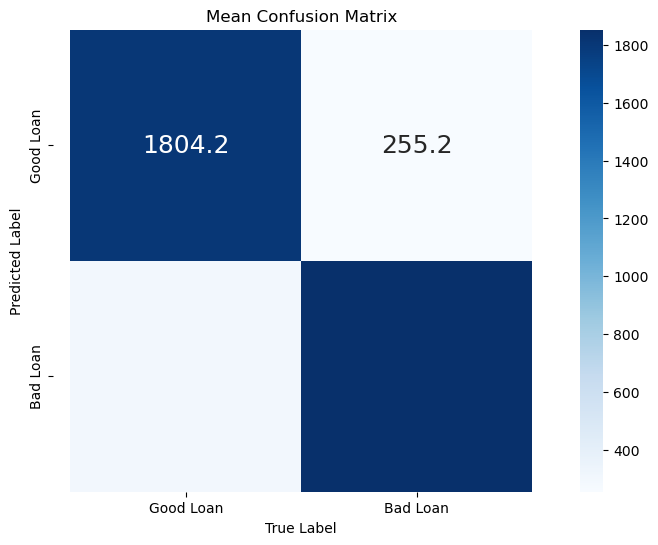

Neural Network processed


In [41]:
# test baseline models on undersampling dataset
baseline_tgt = fit_models_summary(models, wrapped_train_X, train_y, undersample=True)

In [42]:
baseline_tgt

,accuracy,auc,ks,precision,recall,f1
Logistic Regression (undersample),0.865582,0.925801,0.737976,0.872493,0.856322,0.864300
Decision Tree (undersample),0.865060,0.921588,0.734375,0.858478,0.874309,0.866292
K Nearest Neighbors (undersample),0.761056,0.804485,0.546501,0.887691,0.597644,0.714221
Random Forest (undersample),0.868428,0.927486,0.740391,0.862470,0.876619,0.869466
Gaussian Naive Bayes (undersample),0.742457,0.896823,0.662252,0.902435,0.546891,0.674571
Light GBM (undersample),0.869757,0.930108,0.741000,0.864640,0.876703,0.870620
XGBoost (undersample),0.868286,0.929399,0.741070,0.863095,0.875223,0.869110
Gradient Boosting (undersample),0.868523,0.929501,0.740827,0.863110,0.875778,0.869393
Neural Network (undersample),0.867480,0.928783,0.738677,0.859324,0.878894,0.868972


In [43]:
models = {
     'Logistic Regression': LogisticRegression(),
     'Decision Tree': DecisionTreeClassifier(max_depth=10,min_samples_split=mss,min_samples_leaf=msl),
    #  'K Nearest Neighbors': KNeighborsClassifier(n_neighbors=20),
     'Random Forest': RandomForestClassifier(n_estimators=20,max_depth=10),
    #  'Gaussian Naive Bayes': GaussianNB(var_smoothing=1),
     'Light GBM': LGBMClassifier(n_estimators=50,max_depth=3),
     'XGBoost': XGBClassifier(n_estimators=50,max_depth=3),
     'Gradient Boosting': GradientBoostingClassifier(n_estimators=50,max_depth=3),
     "Neural Network": MLPClassifier(hidden_layer_sizes = (10,10))
}

In [44]:
performance_df = pd.DataFrame(columns=['accuracy', 'auc', 'ks', 'precision', 'recall', 'f1'])

bagging_models = {}

for model_name, model in models.items():
    print("processing: ", model_name)
    bagging_model = BaggingClassifier(base_estimator=model, n_estimators=10, random_state=42)

    # Training Bagging model
    bagging_model.fit(wrapped_train_X, train_y)

    bagging_models[model_name + '_bagging'] = bagging_model
    accuracy, auc, ks, conf_matrix, precision, recall, f1 = calculate_scores(bagging_model, wrapped_train_X, train_y, wrapped_test_X, test_y)
    performance_dict = {
        'accuracy': accuracy,
        'auc': auc,
        'ks': ks,
        'precision': precision,
        'recall': recall,
        'f1': f1
    }
    performance_df.loc[model_name + ' (bagging)'] = performance_dict
    
performance_df

processing:  Logistic Regression
processing:  Decision Tree
processing:  Random Forest
processing:  Light GBM
[LightGBM] [Info] Number of positive: 10538, number of negative: 10538
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 994
[LightGBM] [Info] Number of data points in the train set: 21076, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499953 -> initscore=-0.000190
[LightGBM] [Info] Start training from score -0.000190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 10538, number of negative: 10538
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enou

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 10538, number of negative: 10538
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 994
[LightGBM] [Info] Number of data points in the train set: 21076, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510344 -> initscore=0.041380
[LightGBM] [Info] Start training from score 0.041380
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 10538, number of negative: 10538
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`

,accuracy,auc,ks,precision,recall,f1
Logistic Regression (bagging),0.873620,0.927885,0.736519,0.664203,0.853075,0.746884
Decision Tree (bagging),0.870384,0.930328,0.741974,0.652186,0.872058,0.746264
Random Forest (bagging),0.869803,0.930750,0.743408,0.651150,0.870919,0.745168
Light GBM (bagging),0.870550,0.932053,0.743235,0.652644,0.871678,0.746424
XGBoost (bagging),0.870052,0.932011,0.743392,0.651104,0.873576,0.746109
Gradient Boosting (bagging),0.870633,0.932014,0.743599,0.652396,0.873576,0.746957
Neural Network (bagging),0.867480,0.931505,0.743787,0.644389,0.878512,0.743454


Stacking with LogisticRegression()
Stacking with DecisionTreeClassifier(max_depth=10, min_samples_leaf=30, min_samples_split=60)
Stacking with RandomForestClassifier(max_depth=10, n_estimators=20)
Stacking with LGBMClassifier(max_depth=3, n_estimators=50)
[LightGBM] [Info] Number of positive: 8463, number of negative: 8397
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 984
[LightGBM] [Info] Number of data points in the train set: 16860, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501957 -> initscore=0.007829
[LightGBM] [Info] Start training from score 0.007829
Stacking with XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early

Stacking with MLPClassifier(hidden_layer_sizes=(10, 10))
Mean Confusion Matrix for Model:
 [[1769.6  338. ]
 [ 284.6 1823. ]]


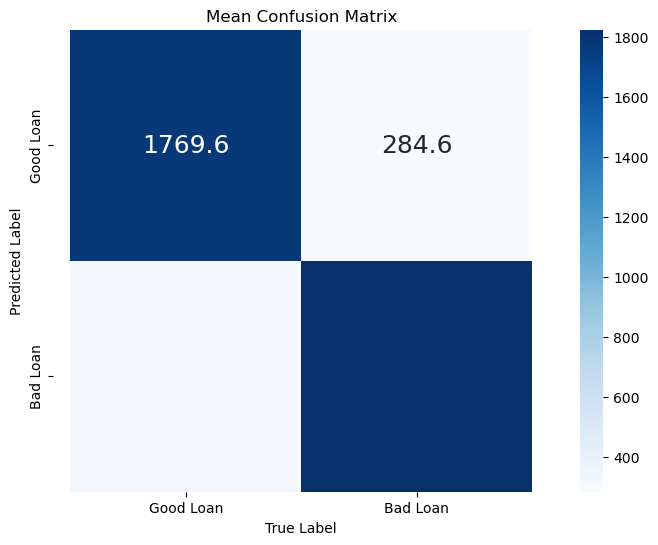

Stacking baseline:
Accuracy: 0.8522965103846613
AUC: 0.9108409859480349
recall: 0.8650154177279006
CPU times: total: 41 s
Wall time: 38.2 s


In [45]:
%%time
stack_model = XGBClassifier(max_depth = 3)
accuracy, auc, ks, precision, recall, f1 = calculate_cv_scores(stack_model, wrapped_train_X, train_y,
                                        stacking = True, models = models,
                                        verbose = True)
print('Stacking baseline:')
print('Accuracy:', accuracy)
print('AUC:', auc)
print('recall:', recall)

In [46]:
holdout_summary = pd.DataFrame(columns = ['accuracy','auc','ks','precision','recall','f1'])

X_trn, y_trn = wrapped_train_X, train_y

for name, model in models.items():
    accuracy, auc, ks, conf_matrix, precision, recall, f1 = calculate_scores(model, X_trn, y_trn, wrapped_test_X, test_y)
    holdout_summary.loc[name] = [accuracy, auc, ks, precision, recall, f1]

X2_trn, X2_tst = fit_first_level(models, wrapped_train_X, train_y, wrapped_test_X)


# add bagging model performance
for model_name, bagging_model in bagging_models.items():
    accuracy, auc, ks, conf_matrix, precision, recall, f1 = calculate_scores(bagging_model, wrapped_train_X, train_y, wrapped_test_X, test_y)
    holdout_summary.loc[model_name] = [accuracy, auc, ks, precision, recall, f1]


# add stack model performance
stack_model = XGBClassifier()
accuracy, auc, ks, conf_matrix, precision, recall, f1 = calculate_scores(stack_model, X2_trn, train_y, X2_tst, test_y)
holdout_summary.loc['Stacking Model (XGB)'] = [accuracy, auc, ks, precision, recall, f1]

[LightGBM] [Info] Number of positive: 10538, number of negative: 10538
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 994
[LightGBM] [Info] Number of data points in the train set: 21076, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Stacking with LogisticRegression()
Stacking with DecisionTreeClassifier(max_depth=10, min_samples_leaf=30, min_samples_split=60)
Stacking with RandomForestClassifier(max_depth=10, n_estimators=20)
Stacking with LGBMClassifier(max_depth=3, n_estimators=50)
[LightGBM] [Info] Number of positive: 10538, number of negative: 10538
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM

In [47]:
holdout_summary

,accuracy,auc,ks,precision,recall,f1
Logistic Regression,0.873703,0.927922,0.736931,0.664400,0.853075,0.747008
Decision Tree,0.865156,0.923486,0.734080,0.642153,0.865224,0.737183
Random Forest,0.866816,0.929495,0.743158,0.643115,0.877752,0.742334
Light GBM,0.870633,0.931958,0.742900,0.653003,0.870919,0.746380
XGBoost,0.869554,0.931857,0.742401,0.650510,0.871298,0.744888
Gradient Boosting,0.869720,0.932014,0.743142,0.650452,0.873197,0.745543
Neural Network,0.870384,0.929573,0.742030,0.652707,0.869780,0.745768
Logistic Regression_bagging,0.873620,0.927885,0.736519,0.664203,0.853075,0.746884
Decision Tree_bagging,0.870384,0.930328,0.741974,0.652186,0.872058,0.746264
Random Forest_bagging,0.869803,0.930750,0.743408,0.651150,0.870919,0.745168


In [48]:
!pip install shap

In [49]:
pip install lime

Note: you may need to restart the kernel to use updated packages.


In [50]:
import lime
import lime.lime_tabular

In [51]:
explainer = lime.lime_tabular.LimeTabularExplainer(wrapped_train_X.values, 
                                                   feature_names=wrapped_train_X.columns.tolist(), 
                                                   class_names=['Good Loan', 'Bad Loan'], 
                                                   discretize_continuous=True)


In [52]:
# Iterate over each model and create a separate explainer
for model_name, model in bagging_models.items():
    print("Explaining: ", model_name)
    
    # Create a LIME explainer object
    explainer = lime.lime_tabular.LimeTabularExplainer(wrapped_train_X.values, 
                                                       feature_names=wrapped_train_X.columns.tolist(), 
                                                       class_names=['Good Loan', 'Bad Loan'], 
                                                       discretize_continuous=True)

    # Choose an instance to explain (you can change this index)
    instance_index = 0
    instance = wrapped_test_X.iloc[instance_index].values

    # Explain the instance
    explanation = explainer.explain_instance(instance, 
                                             model.predict_proba, # Use the current bagging model
                                             num_features=len(wrapped_test_X.columns))

    # Display the explanation
    explanation.show_in_notebook(show_table=True, show_all=False)

Explaining:  Logistic Regression_bagging


Explaining:  Decision Tree_bagging


Explaining:  Random Forest_bagging


Explaining:  Light GBM_bagging


Explaining:  XGBoost_bagging


Explaining:  Gradient Boosting_bagging


Explaining:  Neural Network_bagging


In [53]:
import shap

Explaining:  Logistic Regression_bagging


PermutationExplainer explainer: 12052it [23:46,  8.42it/s]                                                             


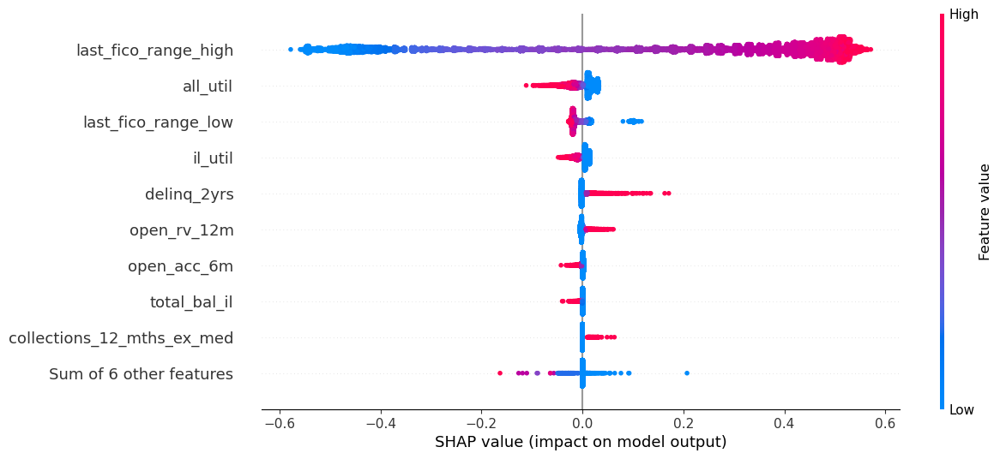

Explaining:  Decision Tree_bagging


PermutationExplainer explainer: 12052it [31:19,  6.38it/s]                                                             


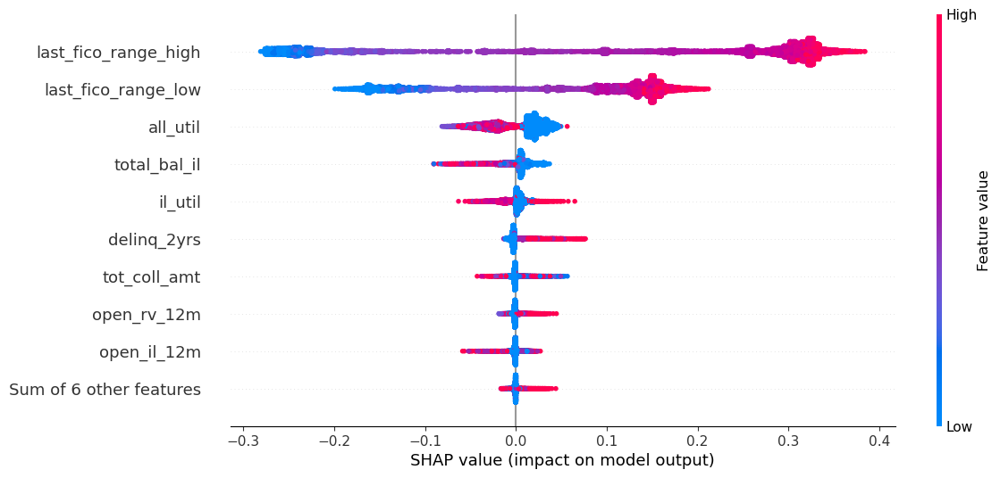

Explaining:  Random Forest_bagging


PermutationExplainer explainer: 12052it [6:28:15,  1.93s/it]                                                           


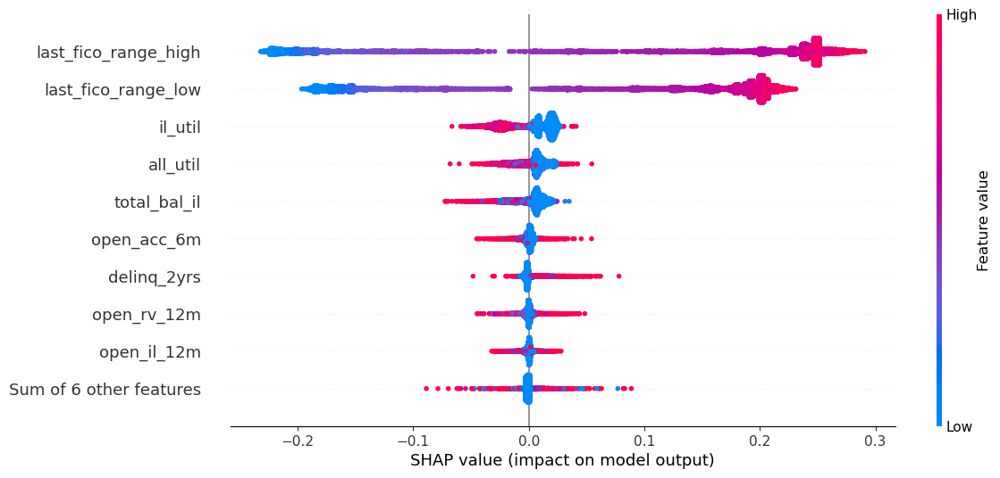

Explaining:  Light GBM_bagging


PermutationExplainer explainer: 12052it [1:38:37,  2.03it/s]                                                           


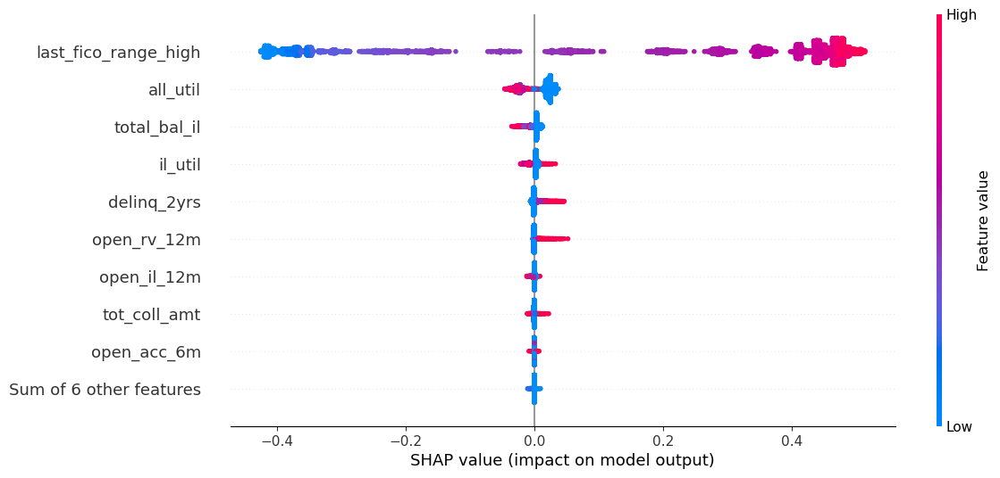

Explaining:  XGBoost_bagging


PermutationExplainer explainer: 12052it [59:38,  3.36it/s]                                                             


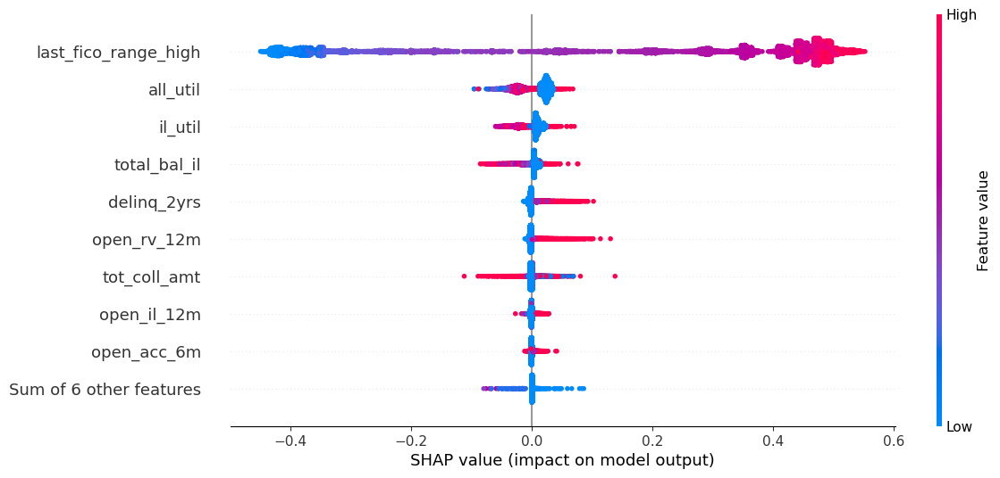

Explaining:  Gradient Boosting_bagging


PermutationExplainer explainer: 12052it [1:29:59,  2.23it/s]                                                           


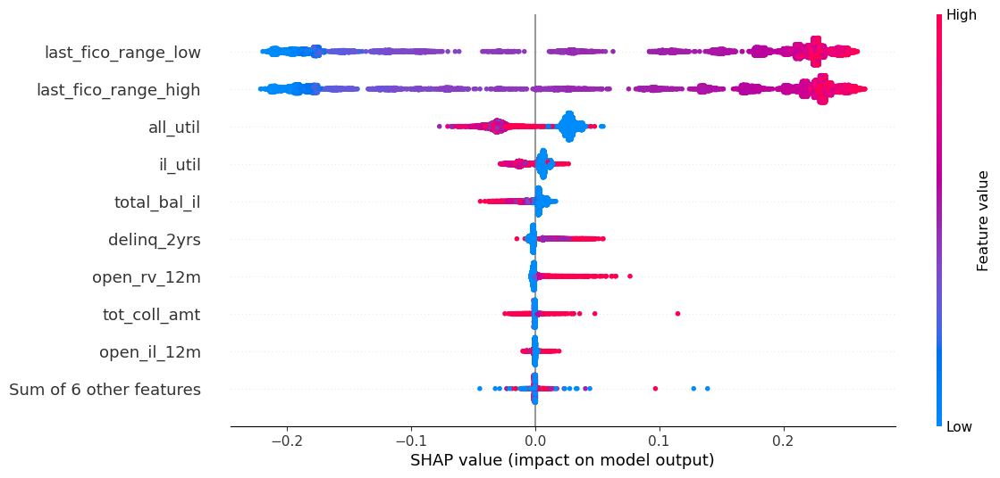

Explaining:  Neural Network_bagging


PermutationExplainer explainer: 12052it [44:39,  4.48it/s]                                                             


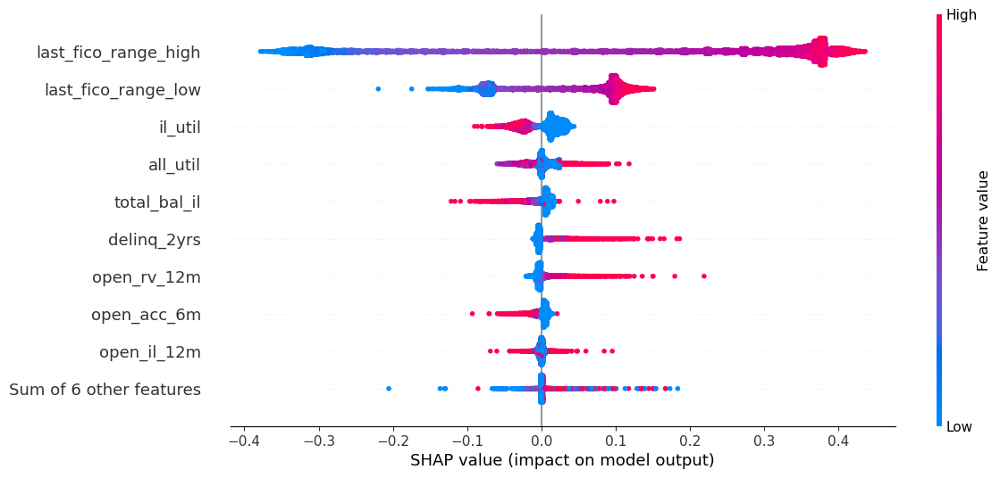

In [54]:
# Iterate over each model and create a separate explainer
for model_name, model in bagging_models.items(): # Use the fitted models from bagging_models
    print("Explaining: ", model_name)
    # Access the underlying estimator of the BaggingClassifier
    explainer = shap.Explainer(model.predict_proba, wrapped_train_X)  # Use predict_proba for classification models

    # Calculate SHAP values
    shap_values = explainer(wrapped_test_X)

    # Visualize the explanations for the first class (index 0) for all features
    shap.plots.beeswarm(shap_values[:, :, 0], plot_size=(12,6)) # Select all features and the first class

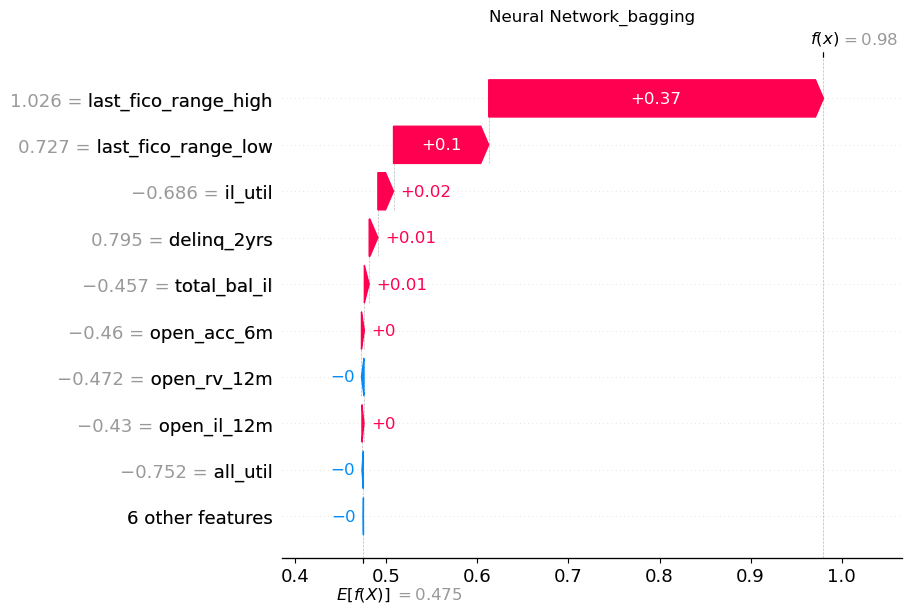

In [55]:
    # Visualize the explanations for the first class (index 0) for all features
    shap.plots.waterfall(shap_values[0, :, 0], show=False)
    plt.title(model_name)
    plt.show()